# Hands-on Image Processing with Python

### Author: Sandipan Dey

## Solutions to Selected Exercises

## Chapter 1

### Ex. 3: Implement Instagram-like Gotham Filter

237


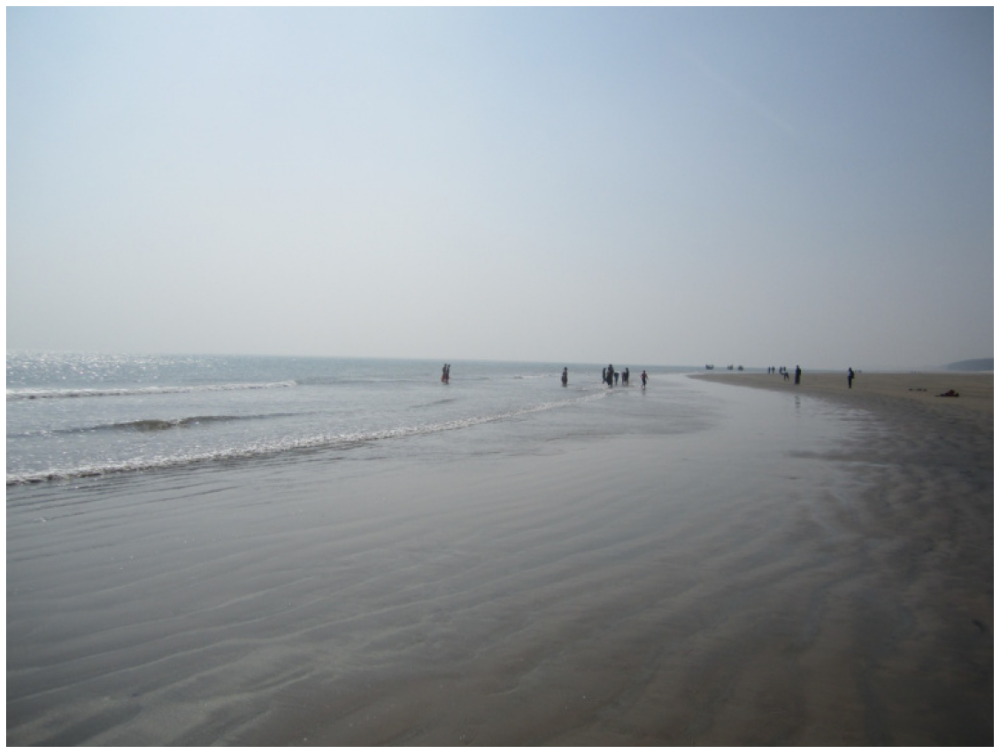

In [2]:
%matplotlib inline

from PIL import Image
import numpy as np
import matplotlib.pylab as plt

im = Image.open('images/sea.jpg') # assumed pixel values in [0,255]
print(np.max(im))
# 255
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.axis('off')
plt.show()

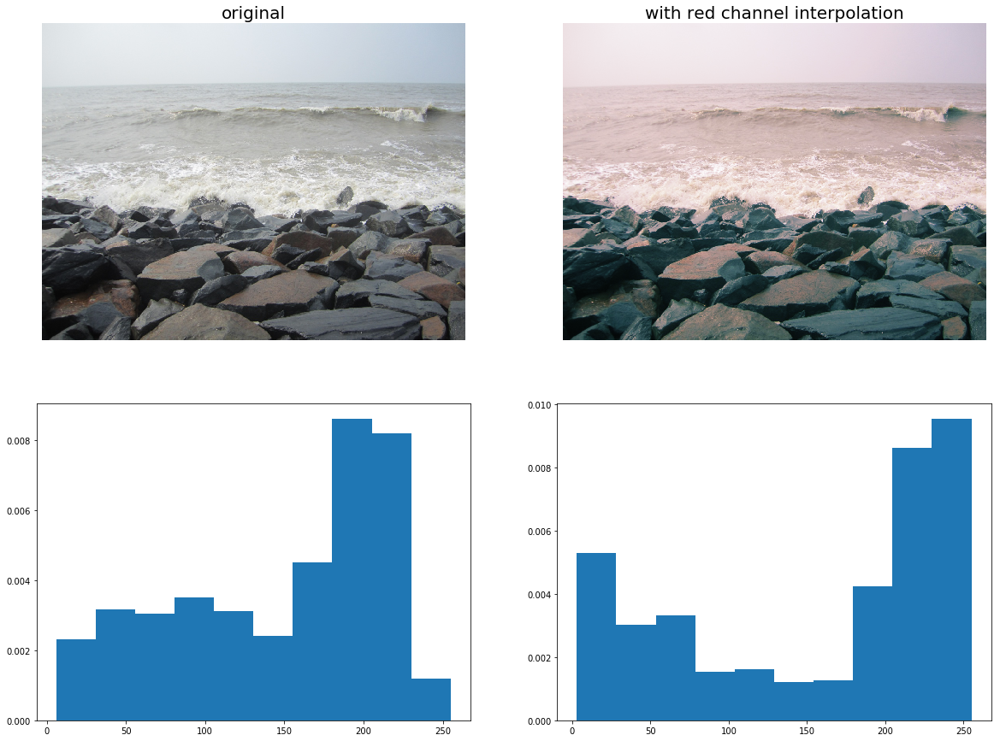

In [12]:
r, g, b = im.split() # split the channels
r_old = np.linspace(0,255,11)   # reference points
r_new = [0., 12.75, 25.5, 51., 76.5, 127.5, 178.5, 204., 229.5, 242.25, 255.] # new values at reference points

# strech the red channel histogram with interpolation and obtain new red channel values for each pixel                       
r1 = Image.fromarray((np.reshape(np.interp(np.array(r).ravel(), r_old, r_new),
                                 (im.height, im.width))).astype(np.uint8), mode='L')

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(222)
im1 = Image.merge('RGB', (r1, g, b))
plt.imshow(im1)
plt.axis('off')
plt.title('with red channel interpolation', size=20)
plt.subplot(223)
plt.hist(np.array(r).ravel(), normed=True)
plt.subplot(224)
plt.hist(np.array(r1).ravel(), normed=True)
plt.show()

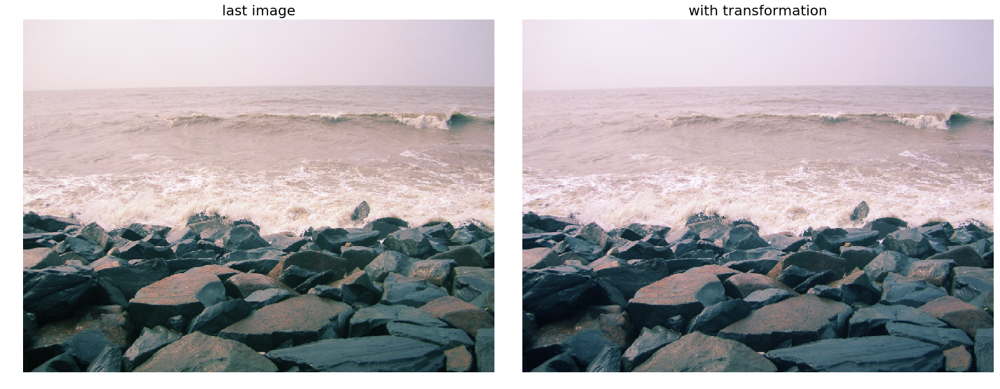

In [13]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(im1)
plt.title('last image', size=20)
plt.axis('off')
b1 = Image.fromarray(np.clip(np.array(b) + 7.65, 0, 255).astype(np.uint8))
im1 = Image.merge('RGB', (r1, g, b1))
plt.subplot(122)
plt.imshow(im1)
plt.axis('off')
plt.title('with transformation', size=20)
plt.tight_layout()
plt.show()

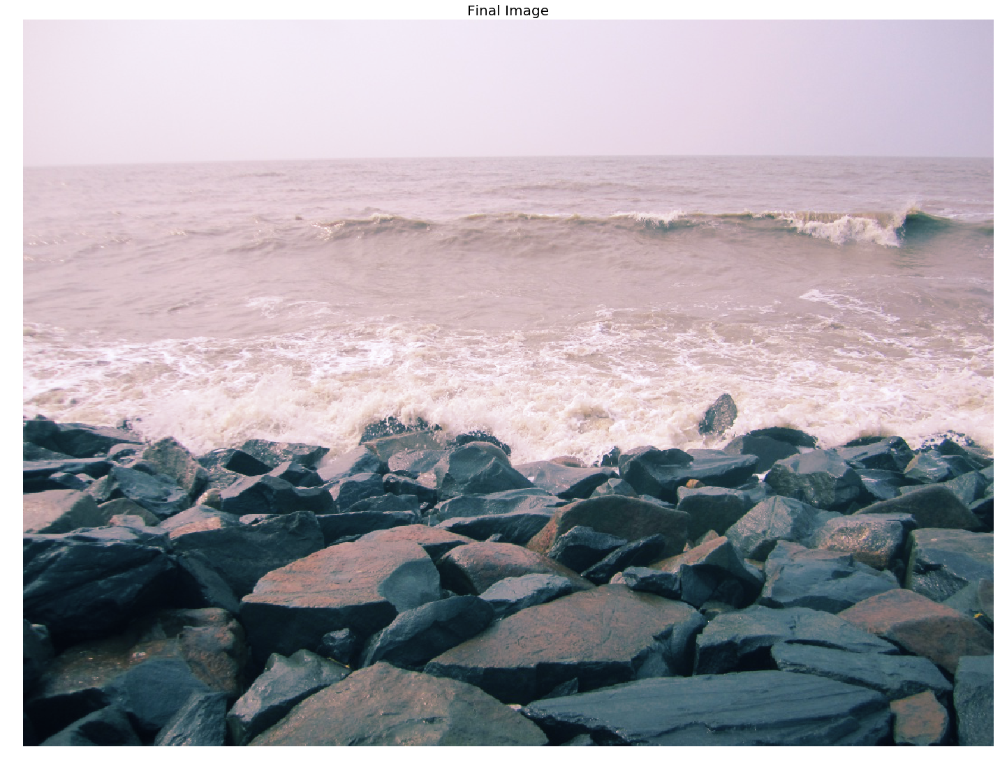

In [15]:
plt.figure(figsize=(20,20))
plt.imshow(im1)
plt.axis('off')
plt.title('Final Image', size=20)
plt.tight_layout()
plt.show()

### Ex. 4: Implement the swirl transformation using warp

(224, 225, 3)


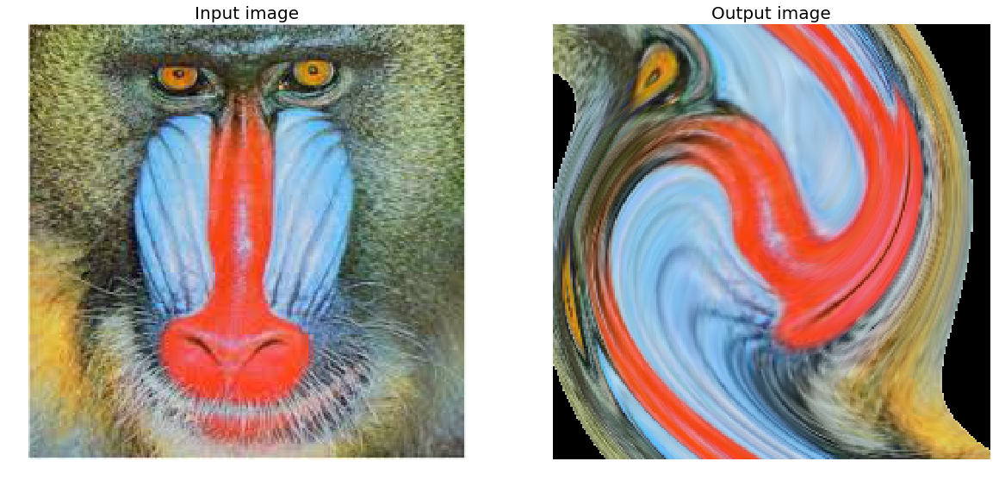

In [26]:
def swirl(xy, x0, y0, R):
    r = np.sqrt((xy[:,1]-x0)**2 + (xy[:,0]-y0)**2)
    a = np.pi*r / R
    xy[:, 1] = (xy[:, 1]-x0)*np.cos(a) + (xy[:, 0]-y0)*np.sin(a) + x0
    xy[:, 0] = -(xy[:, 1]-x0)*np.sin(a) + (xy[:, 0]-y0)*np.cos(a) + y0
    return xy

from skimage.io import imread
from skimage.transform import warp
import matplotlib.pylab as plt
im = imread('images/mandrill.jpg')
print(im.shape)
im1 = warp(im, swirl, map_args={'x0':100, 'y0':100, 'R':250})
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Input image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Output image', size=20)
plt.show()

### Ex. 6: Convert a png image with palette to gray scale with PIL

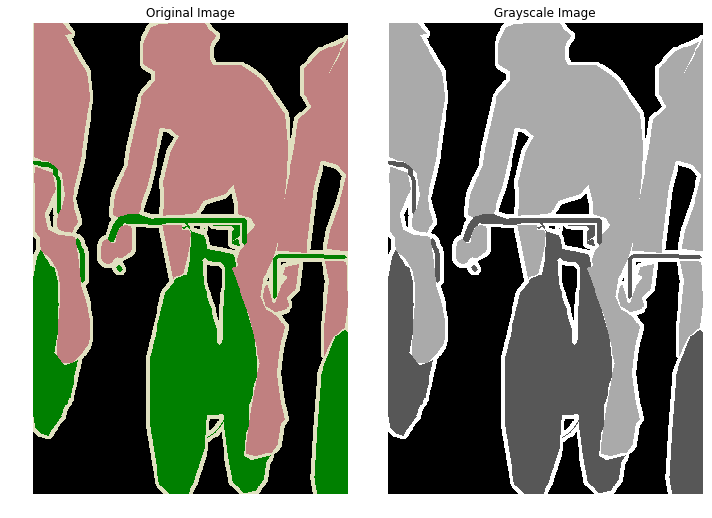

In [32]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def rgb2gray(R, G, B):
    return 0.2989 * R + 0.5870 * G + 0.1140 * B 

img = Image.open('images/bicycle.png') # filename is the png file in question
pal = img.getpalette()     # get the palette

arr = np.zeros((img.height, img.width))
for i in range(arr.shape[0]):
    for j in range(arr.shape[1]):
        idx = img.getpixel((j,i)) # get the index of the pixel in the palette
        R, G, B = pal[3*idx], pal[3*idx+1], pal[3*idx+2] # get the R,G,B values of the pixel
        arr[i,j] = rgb2gray(R, G, B) # convert to grayscale

plt.figure(figsize=(10,8))
plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(122)
plt.imshow(arr, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.tight_layout()
plt.show()

### Ex. 7: Display RGB image color channels in 3D

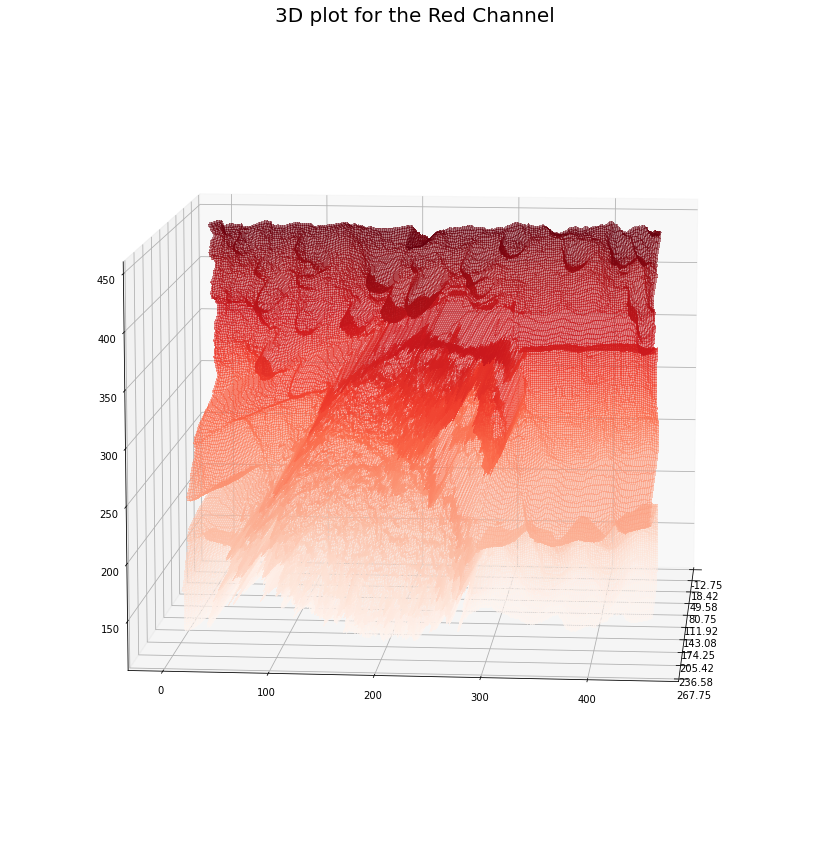

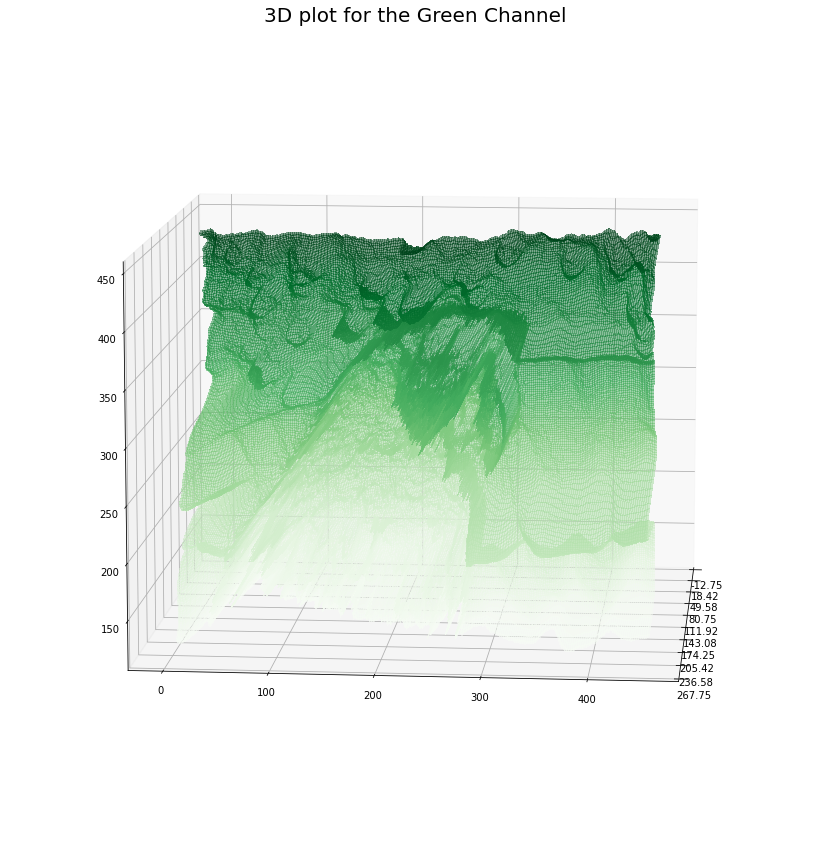

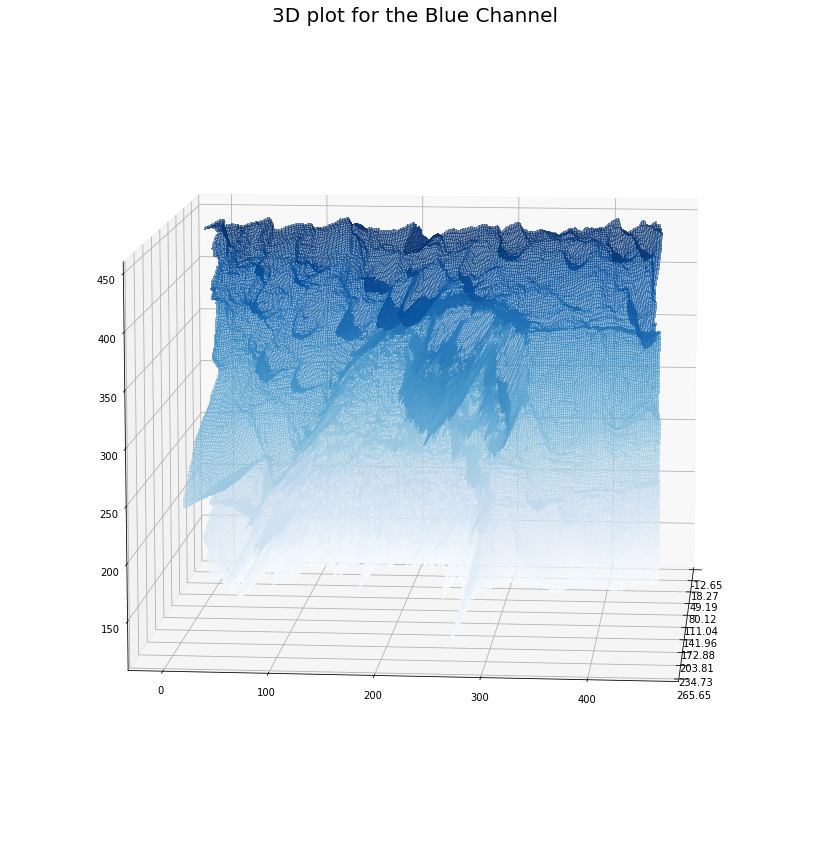

In [3]:
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

def plot_3d(X, Y, Z, cmap='Reds', title=''):
    """
    This function plots 3D visualization of a channel
    It displays (x, y, f(x,y)) for all x,y values
    """ 

    fig = plt.figure(figsize=(15,15))
    ax = fig.gca(projection='3d')
    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=0, antialiased=False, rstride=2, cstride=2, alpha=0.5)
    ax.xaxis.set_major_locator(LinearLocator(10))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.view_init(elev=10., azim=5)
    ax.set_title(title, size=20)
    plt.show()
    
# Read the image
im = imread('images/parrot.jpg')
Y = np.arange(im.shape[0])
X = np.arange(im.shape[1])
X, Y = np.meshgrid(X, Y)

Z1 = im[...,0]
Z2 = im[...,1]
Z3 = im[...,2]

# plot 3D visualizations of the R, G, B channels of the image respectively
plot_3d(Z1, X, im.shape[1]-Y, cmap='Reds', title='3D plot for the Red Channel')
plot_3d(Z2, X, im.shape[1]-Y, cmap='Greens', title='3D plot for the Green Channel')
plot_3d(Z3, X, im.shape[1]-Y, cmap='Blues', title='3D plot for the Blue Channel')

### Ex. 8: Image Projection with Homography with scikit-image

#### 1. Computing Gaussian and Laplacian Pyramids of an image

(220, 220, 3) (321, 450, 3)


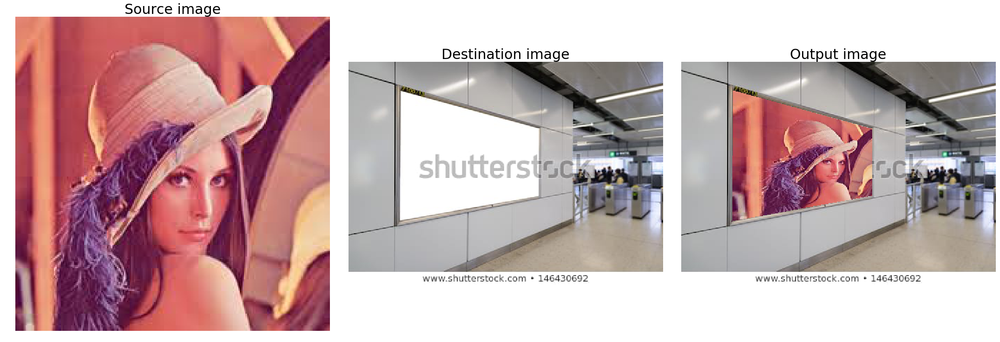

In [35]:
from skimage.transform import ProjectiveTransform
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
from matplotlib.path import Path

im_src = imread('images/lena.jpg');
im_dst = imread('images/shutterstock.jpg')
print(im_src.shape, im_dst.shape)

pt = ProjectiveTransform()
width, height = im_src.shape[0], im_src.shape[1]
src = np.array([[   0.,    0.],
       [height-1,    0.],
       [height-1,  width-1],
       [   0.,  width-1]])
dst = np.array([[ 74.,  41.],
       [ 272.,  96.],
       [ 272.,  192.],
       [ 72.,  228.]])

pt.estimate(src, dst)

width, height = im_dst.shape[0], im_dst.shape[1]

polygon = dst
poly_path=Path(polygon)

x, y = np.mgrid[:height, :width]
coors=np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) 

mask = poly_path.contains_points(coors)
mask = mask.reshape(height, width)

dst_indices = np.array([list(x) for x in list(zip(*np.where(mask > 0)))])
#print(dst_indices)
src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
src_indices[:,0], src_indices[:,1] = src_indices[:,1], src_indices[:,0].copy()
im_out = np.copy(im_dst)
im_out[dst_indices[:,1], dst_indices[:,0]] = im_src[src_indices[:,0], src_indices[:,1]]
plt.figure(figsize=(30,10))
plt.subplot(131), plt.imshow(im_src, cmap='gray'), plt.axis('off'), plt.title('Source image', size=30)
plt.subplot(132), plt.imshow(im_dst, cmap='gray'), plt.axis('off'), plt.title('Destination image', size=30)
plt.subplot(133), plt.imshow(im_out, cmap='gray'), plt.axis('off'), plt.title('Output image', size=30)
plt.tight_layout()
plt.show()

## Chapter 2

### Ex. 1: 3D plot of frequency spectrum of an image and after passing it through Gaussian Blur LPF

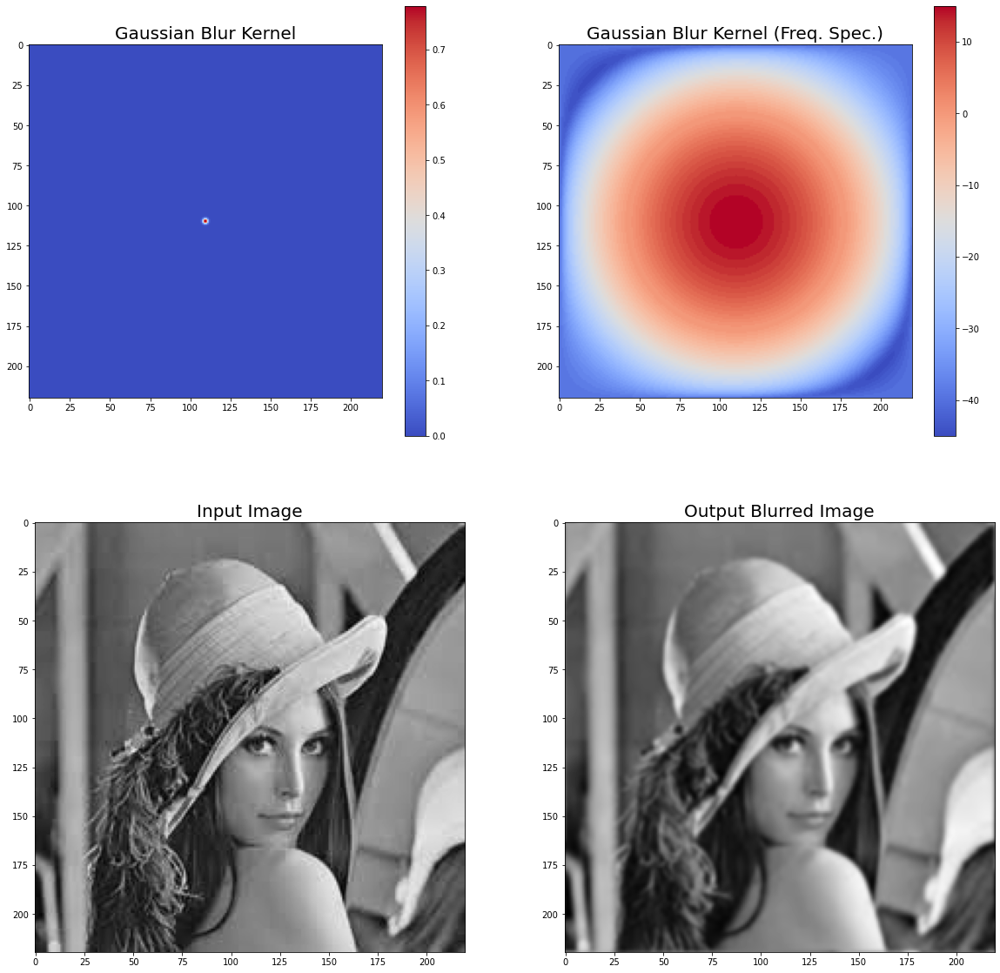

In [4]:
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.color import rgb2gray
from skimage.io import imread
import scipy.fftpack as fp

im = rgb2gray(imread('images/lena.jpg'))
kernel = np.outer(signal.gaussian(im.shape[0], 1), signal.gaussian(im.shape[1], 1))

plt.figure(figsize=(20,20))

plt.subplot(221)
plt.imshow(kernel, cmap='coolwarm')
plt.colorbar()
plt.title('Gaussian Blur Kernel', size=20)

freq = fp.fft2(im)
assert(freq.shape == kernel.shape)
freq_kernel = fp.fft2(fp.ifftshift(kernel))
convolved = freq*freq_kernel # by the Convolution theorem
im_blur = fp.ifft2(convolved).real
im_blur = 255 * im_blur / np.max(im_blur)

# center the frequency response
plt.subplot(222)
plt.imshow( (20*np.log10( 0.01 + fp.fftshift(freq_kernel))).real.astype(int), cmap='coolwarm')
plt.colorbar()
plt.title('Gaussian Blur Kernel (Freq. Spec.)', size=20)

plt.subplot(223)
plt.imshow(im, cmap='gray')
plt.title('Input Image', size=20)

plt.subplot(224)
plt.imshow(im_blur, cmap='gray')
plt.title('Output Blurred Image', size=20)

plt.show()

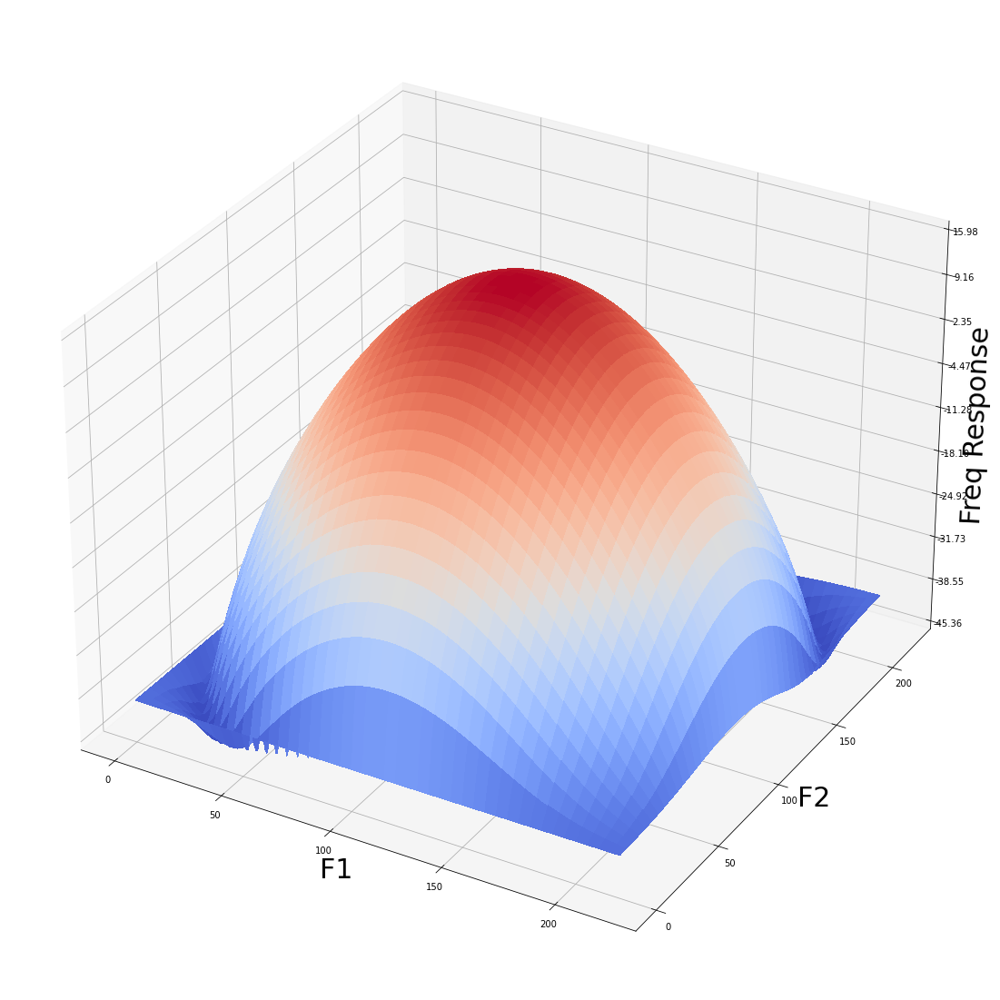

In [5]:
def plot_3d(X, Y, Z):
    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.set_xlabel('F1', size=30)
    ax.set_ylabel('F2', size=30)
    ax.set_zlabel('Freq Response', size=30)
    plt.show()    

fig = plt.figure(figsize=(20,20))
ax = fig.gca(projection='3d')
Y = np.arange(freq.shape[0]) #-freq.shape[0]//2,freq.shape[0]-freq.shape[0]//2)
X = np.arange(freq.shape[1]) #-freq.shape[1]//2,freq.shape[1]-freq.shape[1]//2)
X, Y = np.meshgrid(X, Y)
Z = (20*np.log10( 0.01 + fp.fftshift(freq_kernel))).real
plot_3d(X,Y,Z)

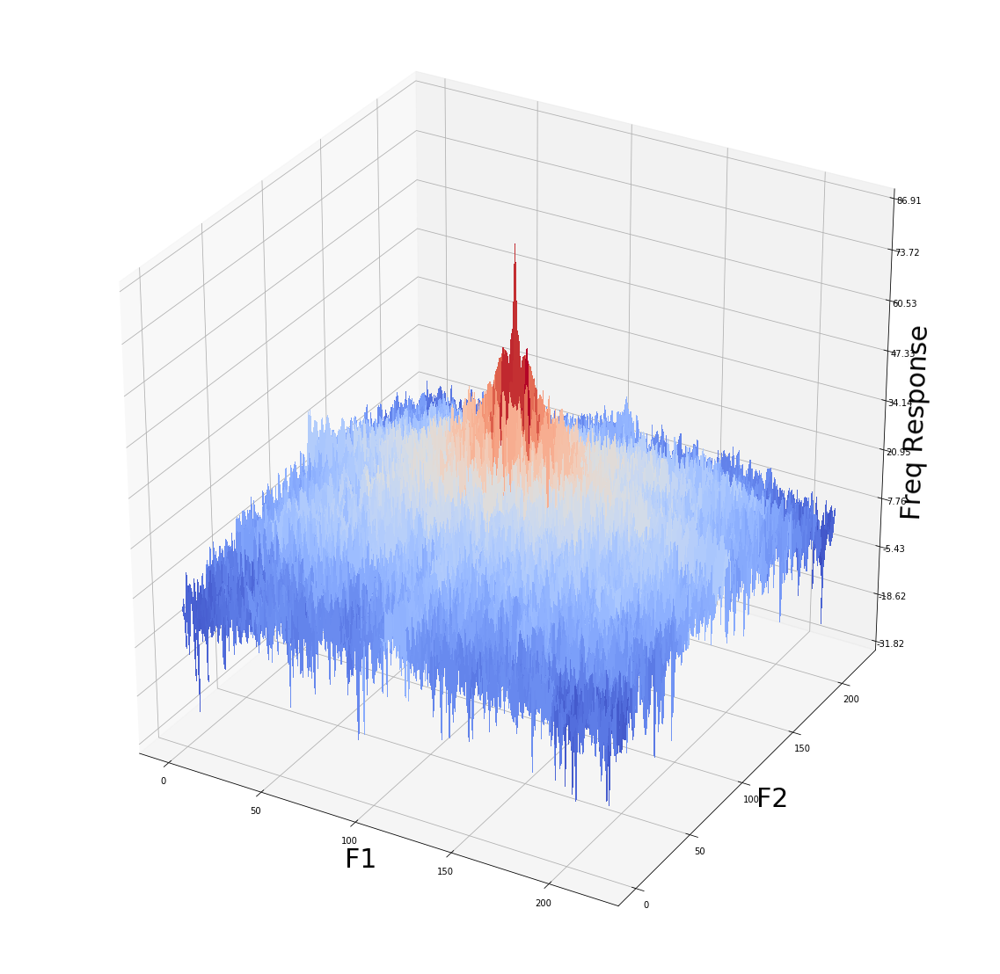

In [78]:
fig = plt.figure(figsize=(20,20))
ax = fig.gca(projection='3d')
Z = (20*np.log10( 0.01 + fp.fftshift(freq))).real
plot_3d(X,Y,Z)

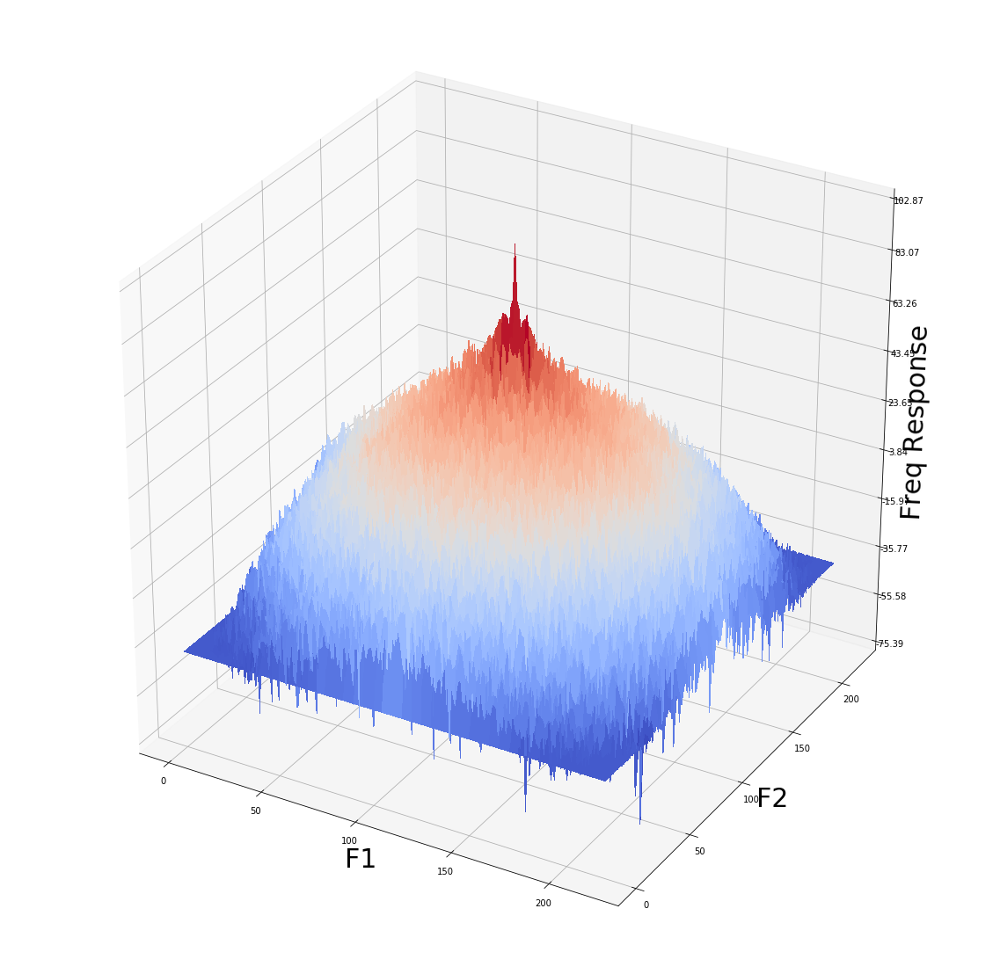

In [79]:
fig = plt.figure(figsize=(20,20))
ax = fig.gca(projection='3d')
Z = (20*np.log10( 0.01 + fp.fftshift(convolved))).real
plot_3d(X,Y,Z)

## Chapter 4

### Ex. 1: Histogram Matching with RGB images

255 255


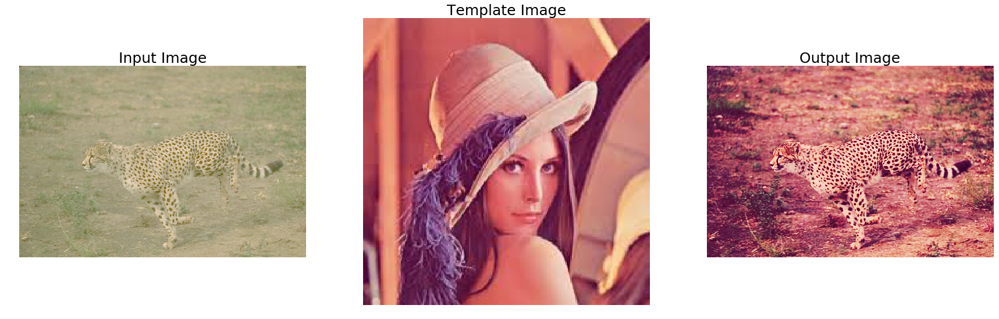

In [73]:
% matplotlib inline
from skimage.exposure import cumulative_distribution
from skimage.color import rgb2gray
import matplotlib.pylab as plt
import numpy as np

def hist_matching(c, c_t, im):
    b = np.interp(c, c_t, np.arange(256))   # find closest matches to b_t
    pix_repl = {i:b[i] for i in range(256)} # dictionary to replace the pixels
    mp = np.arange(0,256)
    for (k, v) in pix_repl.items():
        mp[k] = v
    s = im.shape
    im = np.reshape(mp[im.ravel()], im.shape)
    im = np.reshape(im, s)
    return im

def cdf(im):
    c, b = cumulative_distribution(im)
    #print(b)
    for i in range(b[0]):
        c = np.insert(c, 0, 0)
    for i in range(b[-1]+1, 256):
        c = np.append(c, 1)
    return c

im = imread('images/cheetah.png').astype(np.uint8)
im_t = imread('images/lena.jpg')
print(np.max(im), np.max(im_t))

im1 = np.zeros(im.shape).astype(np.uint8)
for i in range(3):
    c = cdf(im[...,i])
    c_t = cdf(im_t[...,i])
    im1[...,i] = hist_matching(c, c_t, im[...,i])

plt.figure(figsize=(30,10))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('Input Image', size=25)
plt.subplot(132), plt.imshow(im_t), plt.axis('off'), plt.title('Template Image', size=25)
plt.subplot(133), plt.imshow(im1[...,:3]), plt.axis('off'), plt.title('Output Image', size=25)
plt.show()

### Ex. 3: Floyd-Steinberg Dithering

255.0 0.0 2


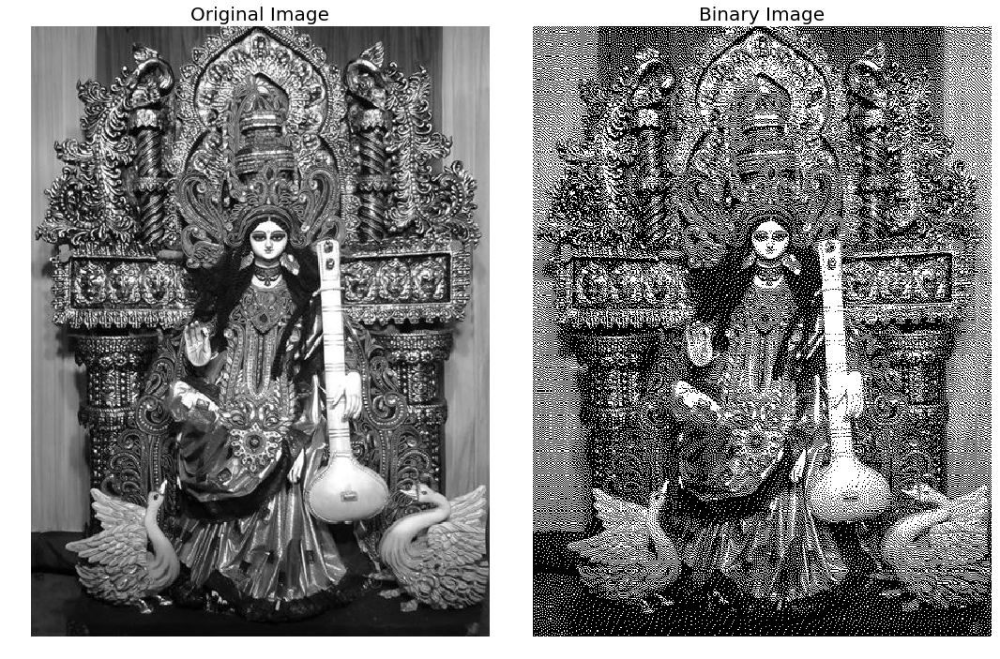

In [62]:
def find_closest_palette_color(oldpixel):
    return int(round(oldpixel / 255)*255)

im = rgb2gray(imread('images/godess.jpg'))*255
pixel = np.copy(im)
w, h = im.shape

for y in range(h):
    for x in range(w):
        oldpixel = pixel[x][y]
        newpixel = find_closest_palette_color(oldpixel)
        pixel[x][y] = newpixel
        quant_error = oldpixel - newpixel
        if x < w-1:
           pixel[x + 1][y] = pixel[x + 1][y] + quant_error * 7 / 16
        if x > 0 and y < h-1:
           pixel[x - 1][y + 1] = pixel[x - 1][y + 1] + quant_error * 3 / 16
        if y < h-1:
           pixel[x ][y + 1] = pixel[x ][y + 1] + quant_error * 5 / 16
        if x < w-1 and y < h-1:
           pixel[x + 1][y + 1] = pixel[x + 1][y + 1] + quant_error * 1 / 16

plt.figure(figsize=(15,20))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original Image', size=20)
plt.subplot(122)
plt.imshow(pixel, cmap='gray')
plt.axis('off')
plt.title('Binary Image', size=20)
plt.tight_layout()
plt.show()

## Chapter 5

### Ex. 6-7: Blending images with Pyramids

c:\courses\my books\bpb\solving image processing problems with python\scikit-image\skimage\transform\_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


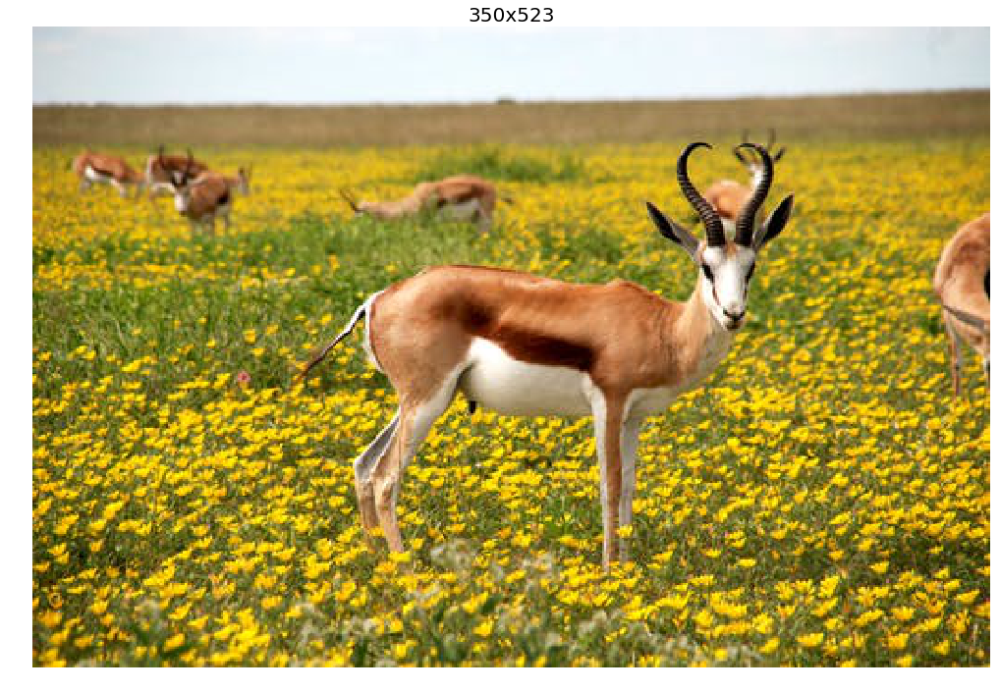

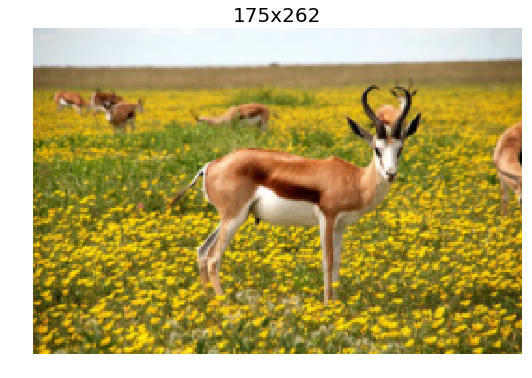

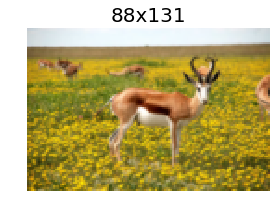

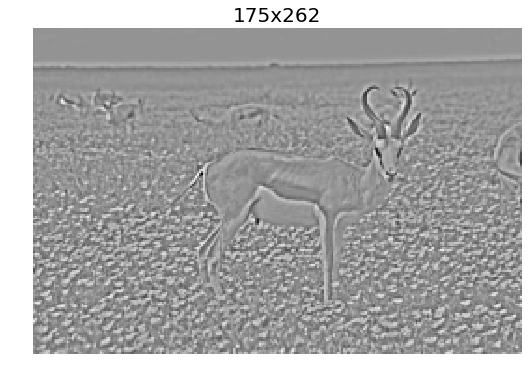

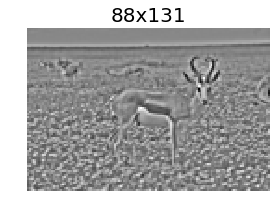

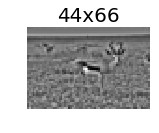

In [36]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import pyramid_reduce, pyramid_laplacian, pyramid_expand, resize

image = imread('images/antelops.jpeg')

def get_gaussian_pyramid(image):
    rows, cols, dim = image.shape
    gaussian_pyramid = [image]
    while rows > 1 and cols > 1:
        #print(rows, cols)
        image = pyramid_reduce(image, downscale=2)
        gaussian_pyramid.append(image)
        #print(image.shape)
        rows //= 2
        cols //= 2
    return gaussian_pyramid

def get_laplacian_pyramid(gaussian_pyramid):
    laplacian_pyramid = [gaussian_pyramid[len(gaussian_pyramid)-1]]
    for i in range(len(gaussian_pyramid)-2, -1, -1):
        image = gaussian_pyramid[i] - resize(pyramid_expand(gaussian_pyramid[i+1]), gaussian_pyramid[i].shape)
        #print(i, image.shape)
        laplacian_pyramid.append(np.copy(image))
    laplacian_pyramid = laplacian_pyramid[::-1]
    return laplacian_pyramid


gaussian_pyramid = get_gaussian_pyramid(image)
laplacian_pyramid = get_laplacian_pyramid(gaussian_pyramid)
    
w, h = 20, 12
for i in range(3):
    plt.figure(figsize=(w,h))
    p = gaussian_pyramid[i]
    plt.imshow(p)
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()
    
w, h = 10, 6
for i in range(1,4):
    plt.figure(figsize=(w,h))
    p = laplacian_pyramid[i]
    plt.imshow(rgb2gray(p), cmap='gray')
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()

#### 2. Reconstructing an image from its Laplacian Pyramid only

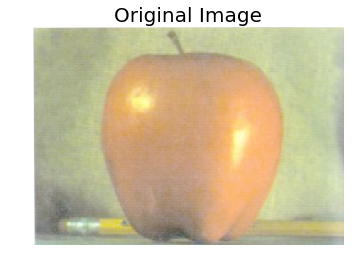

c:\courses\my books\bpb\solving image processing problems with python\scikit-image\skimage\transform\_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


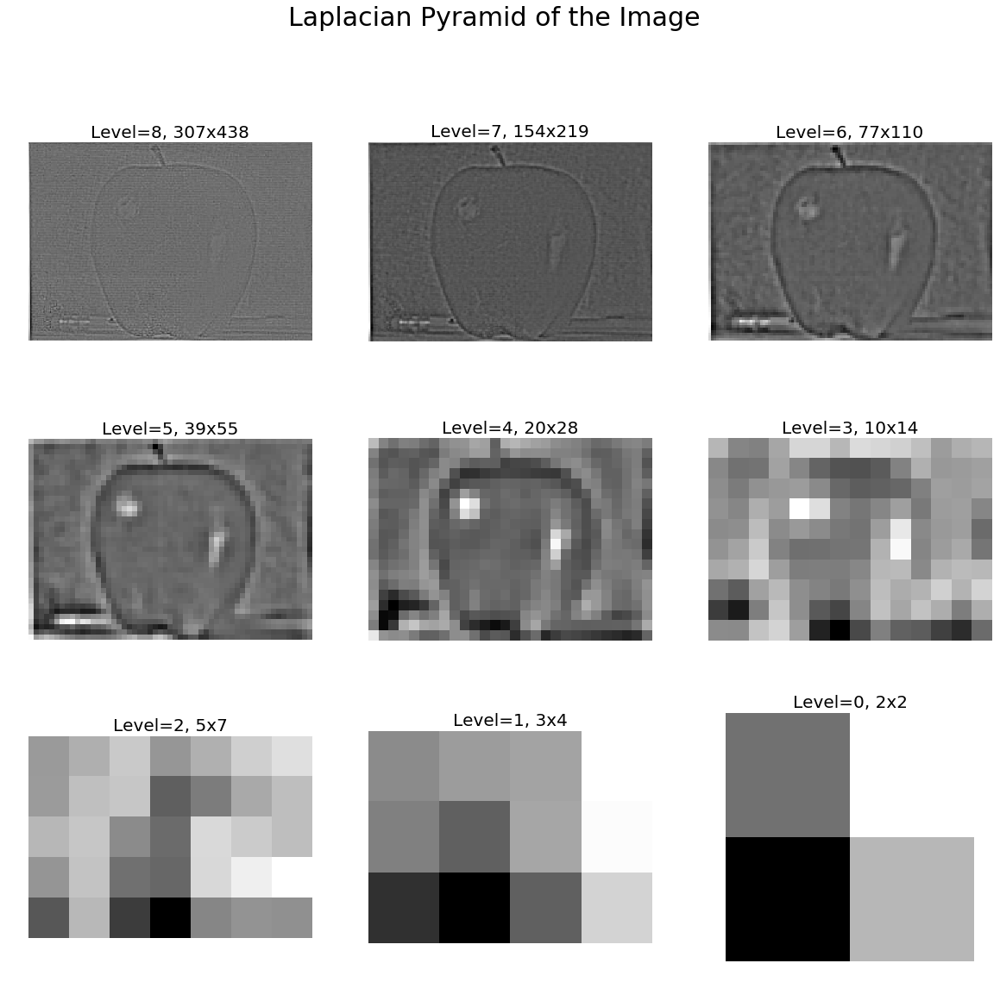

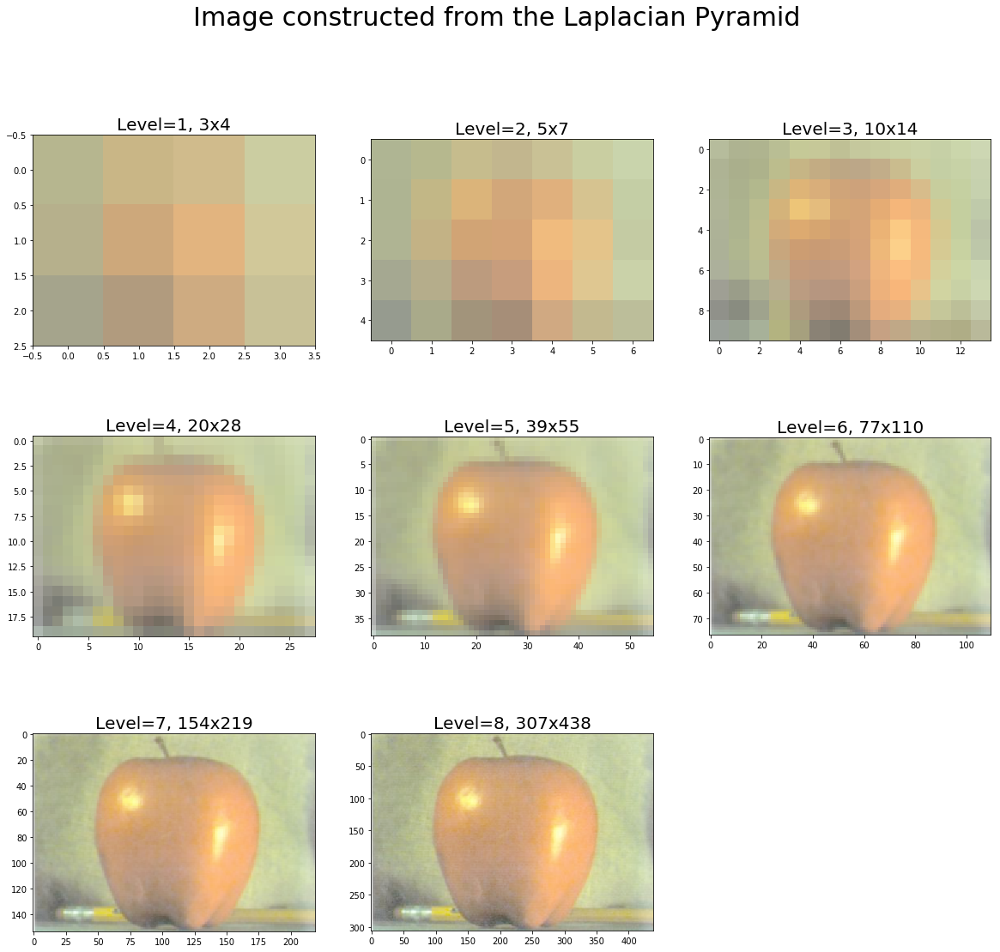

In [75]:
def reconstruct_image_from_laplacian_pyramid(pyramid):
    i = len(pyramid) - 2
    prev = pyramid[i+1]
    plt.figure(figsize=(20,18))
    j = 1
    while i >= 0:
        prev = resize(pyramid_expand(prev, upscale=2), pyramid[i].shape)
        im = np.clip(pyramid[i] + prev,0,1)
        plt.subplot(3,3,j)
        plt.imshow(im)
        plt.title('Level=' + str(j) + ', ' + str(im.shape[0]) + 'x' + str(im.shape[1]), size=20)
        prev = im
        i -= 1
        j += 1
    plt.suptitle('Image constructed from the Laplacian Pyramid', size=30)
    plt.show()
    return im

from skimage.color import rgb2gray
image = imread('images/apple.png')[...,:3] / 255
plt.imshow(image)
plt.title('Original Image', size=20)
plt.axis('off')
plt.show()

pyramid = get_laplacian_pyramid(get_gaussian_pyramid(image))
plt.gray()
plt.figure(figsize=(20,18))
for i in range(9):
    plt.subplot(3,3,i+1)
    image = pyramid[i]
    plt.imshow(rgb2gray(image))
    plt.title('Level=' + str(8-i) + ', ' + str(image.shape[0]) + 'x' + str(image.shape[1]), size=20)
    plt.axis('off')
plt.suptitle('Laplacian Pyramid of the Image', size=30)
#plt.tight_layout()
plt.show()
im = reconstruct_image_from_laplacian_pyramid(pyramid)

#### 3. Blending two images with the pyramids

c:\courses\my books\bpb\solving image processing problems with python\scikit-image\skimage\transform\_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


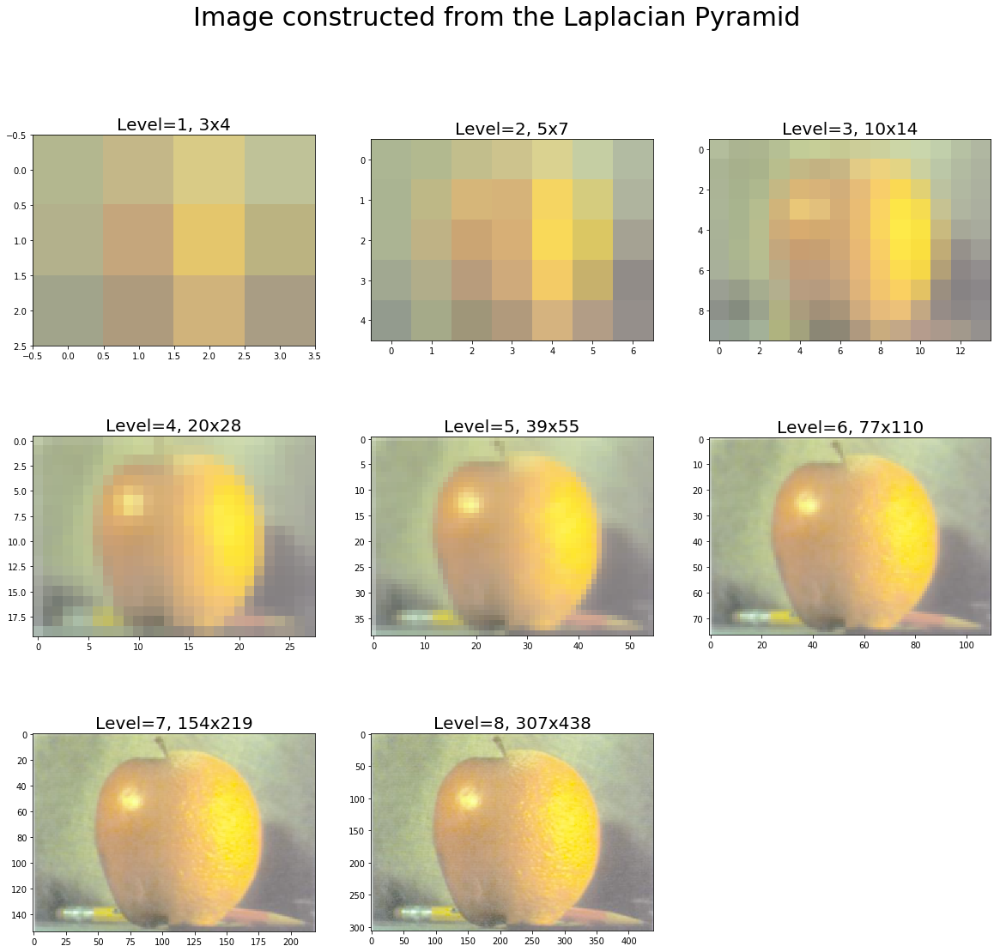

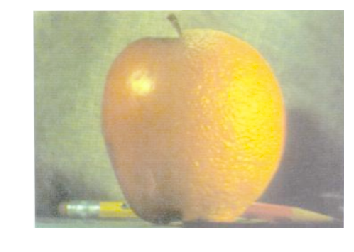

In [51]:
import numpy as np
import matplotlib.pyplot as plt

A = imread('images/apple.png')[...,:3] / 255
B = imread('images/orange.png')[...,:3] / 255
M = imread('images/mask.png')[...,:3] / 255

rows, cols, dim = A.shape
pyramidA = get_laplacian_pyramid(get_gaussian_pyramid(A))
pyramidB = get_laplacian_pyramid(get_gaussian_pyramid(B))
pyramidM = get_gaussian_pyramid(M)

pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

im = reconstruct_image_from_laplacian_pyramid(pyramidC)

plt.imshow(im)
plt.axis('off')
plt.show()

### Ex. 9: Marr and Hildreth's zero-crossing algorithm for edge detection

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel_launcher.py:23: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


0.9206827450980392


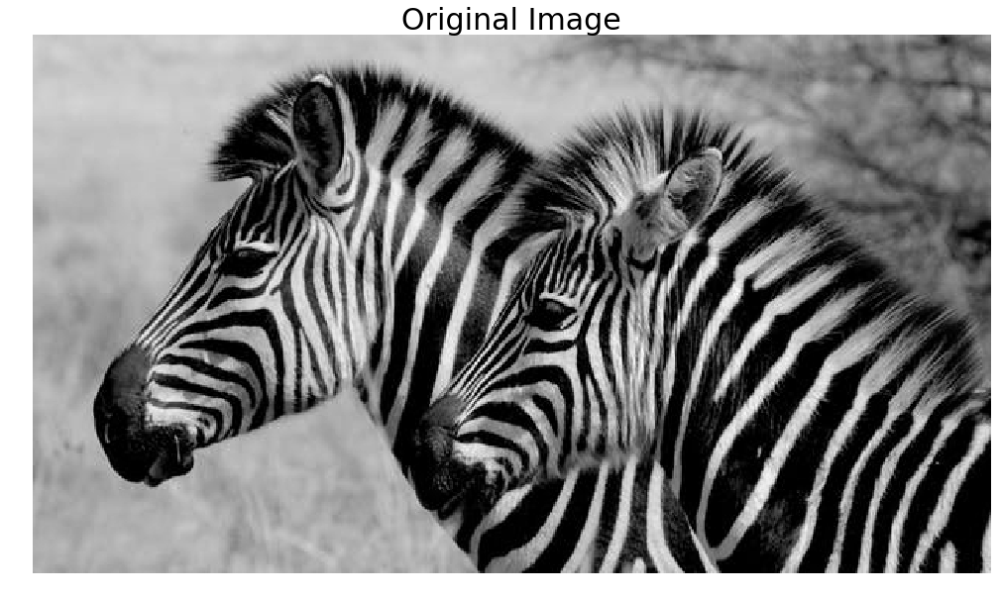

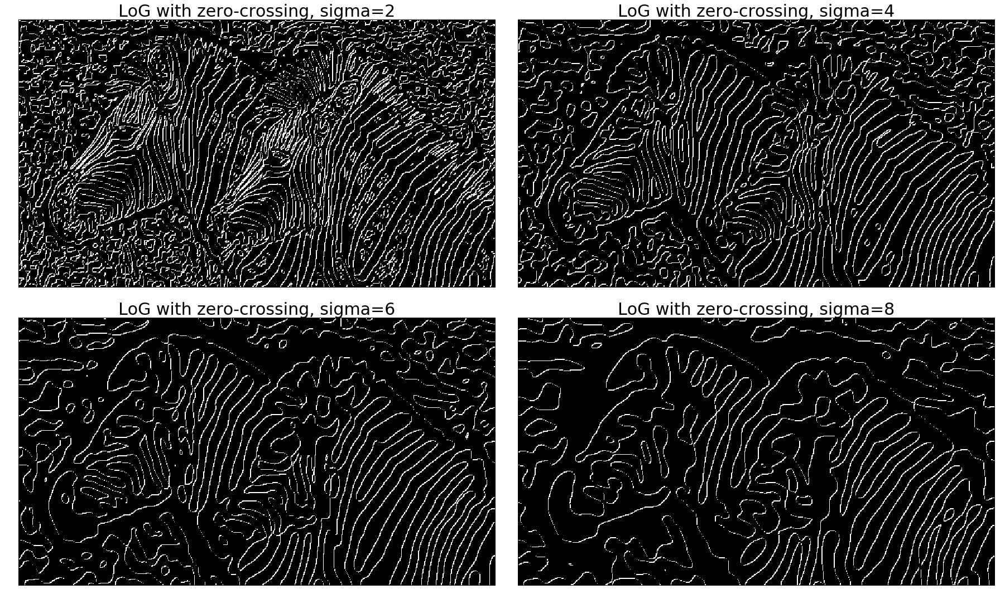

In [85]:
import numpy as np
from scipy import ndimage, misc
import matplotlib.pyplot as plt
from skimage.color import rgb2gray

def any_neighbor_zero(img, i, j):
    for k in range(-1,2):
      for l in range(-1,2):
         if img[i+k, j+k] == 0:
            return True
    return False

def zero_crossing(img):
  img[img > 0] = 1
  img[img < 0] = 0
  out_img = np.zeros(img.shape)
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      if img[i,j] > 0 and any_neighbor_zero(img, i, j):
        out_img[i,j] = 255
  return out_img

img = rgb2gray(misc.imread('images/zebras.jpg'))
print(np.max(img))
plt.figure(figsize=(20,10))
plt.imshow(img)
plt.axis('off')
plt.title('Original Image', size=30)

fig = plt.figure(figsize=(25,15))
plt.gray() # show the filtered result in grayscale
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma/2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    result = zero_crossing(result)
    plt.imshow(result)
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=30)

plt.tight_layout()
plt.show()